In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier ,RandomForestClassifier ,GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import Ridge,Lasso
from sklearn.metrics import roc_auc_score ,mean_squared_error,accuracy_score,classification_report,roc_curve,confusion_matrix
import warnings
warnings.filterwarnings('ignore')
from scipy.stats.mstats import winsorize
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns',None)

In [95]:
df = pd.read_csv('Train.csv')

In [96]:
df.shape

(15000, 40)

In [97]:
df.set_index('ID',inplace = True)

In [142]:
def missing_data(dataset):
    total = df.isnull().sum().sort_values(ascending= False)
    percent = ((df.isnull().sum()/df.isnull().count())*100).sort_values(ascending=False)
    missing_data = pd.concat([total,percent],axis =1, keys =['Total','Percent'])
    return missing_data

null_values = missing_data(df_new)
print(null_values)

                       Total  Percent
cc_cons                    0      0.0
max_credit_amount_jun      0      0.0
gender                     0      0.0
age                        0      0.0
region_code                0      0.0
dc_cons_apr                0      0.0
dc_cons_may                0      0.0
dc_cons_jun                0      0.0
cc_count_apr               0      0.0
cc_count_may               0      0.0
cc_count_jun               0      0.0
dc_count_apr               0      0.0
dc_count_may               0      0.0
dc_count_jun               0      0.0
card_lim                   0      0.0
debit_amount_apr           0      0.0
credit_amount_apr          0      0.0
debit_count_apr            0      0.0
credit_count_apr           0      0.0
max_credit_amount_apr      0      0.0
debit_amount_may           0      0.0
credit_amount_may          0      0.0
credit_count_may           0      0.0
debit_count_may            0      0.0
max_credit_amount_may      0      0.0
debit_amount

In [99]:
drop = null_values[null_values > 90].dropna().index
drop

Index(['investment_4', 'loan_enq', 'vehicle_loan_active', 'investment_3',
       'investment_1', 'vehicle_loan_closed', 'investment_2',
       'personal_loan_closed', 'personal_loan_active'],
      dtype='object')

In [100]:
df.drop(drop,axis =1,inplace = True)

In [101]:
df.shape

(15000, 30)

In [102]:
Null_columns = df.columns[df.isnull().sum() > 0].tolist()
print(Null_columns)

['dc_cons_apr', 'dc_cons_may', 'dc_cons_jun', 'cc_count_apr', 'cc_count_may', 'cc_count_jun', 'dc_count_apr', 'dc_count_may', 'dc_count_jun', 'card_lim', 'debit_amount_apr', 'credit_amount_apr', 'debit_count_apr', 'credit_count_apr', 'max_credit_amount_apr', 'debit_amount_may', 'credit_amount_may', 'credit_count_may', 'debit_count_may', 'max_credit_amount_may', 'debit_amount_jun', 'credit_amount_jun', 'credit_count_jun', 'debit_count_jun', 'max_credit_amount_jun']


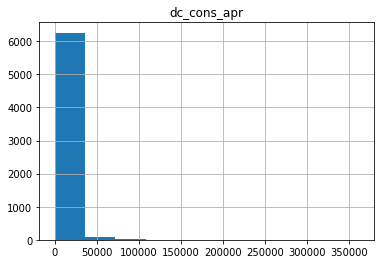

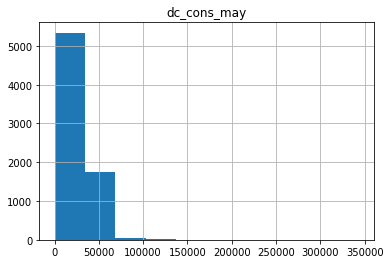

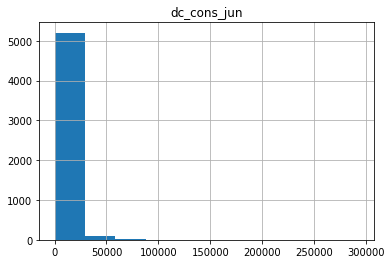

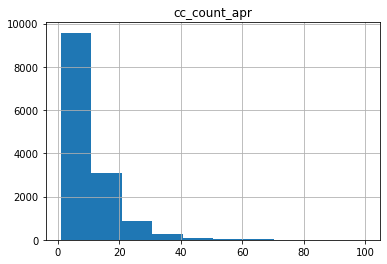

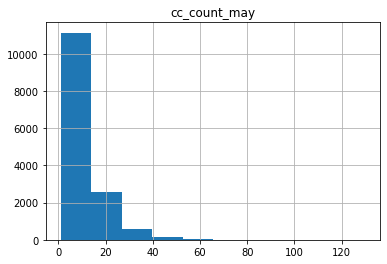

...

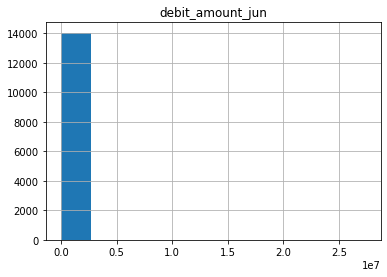

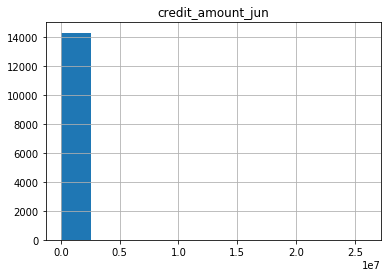

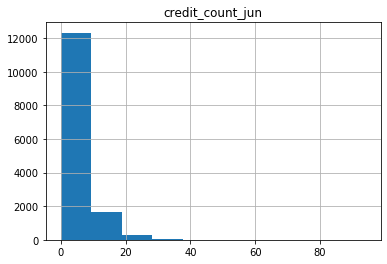

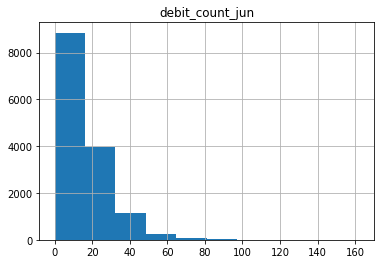

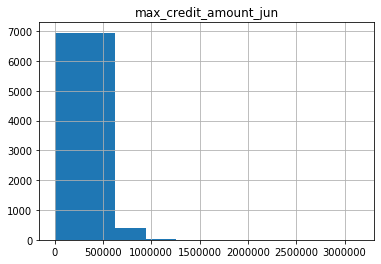

In [103]:
for i in Null_columns:
    plt.title(i)
    df[i].hist()
    plt.show()

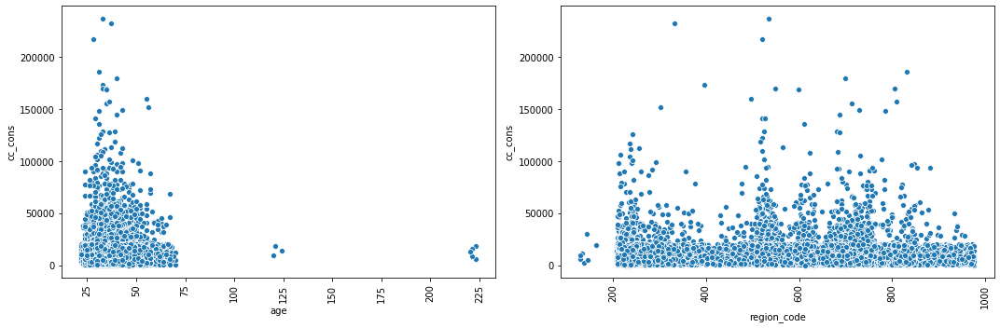

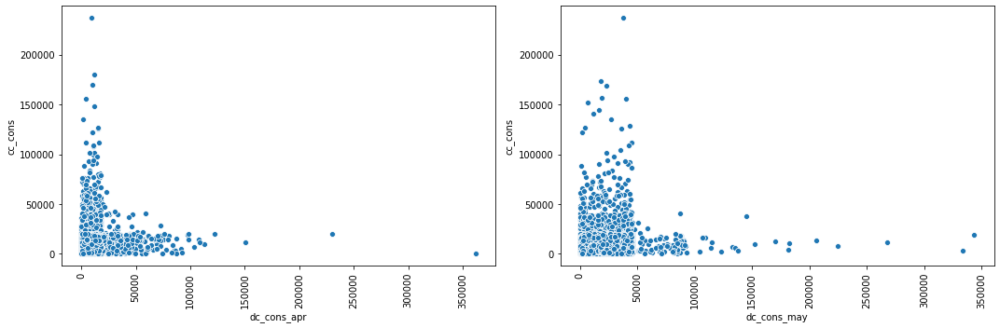

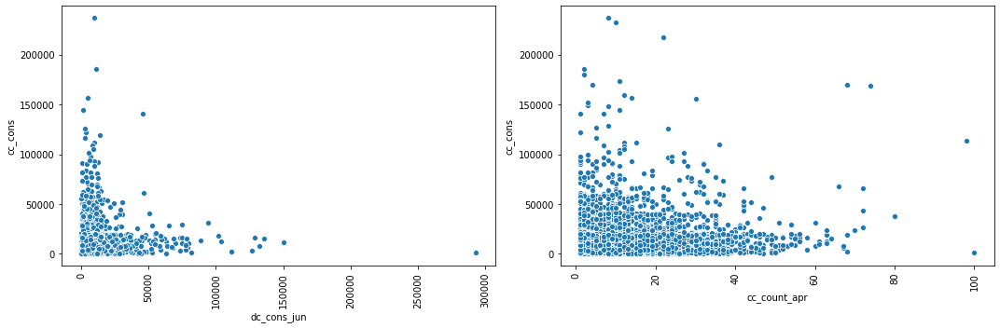

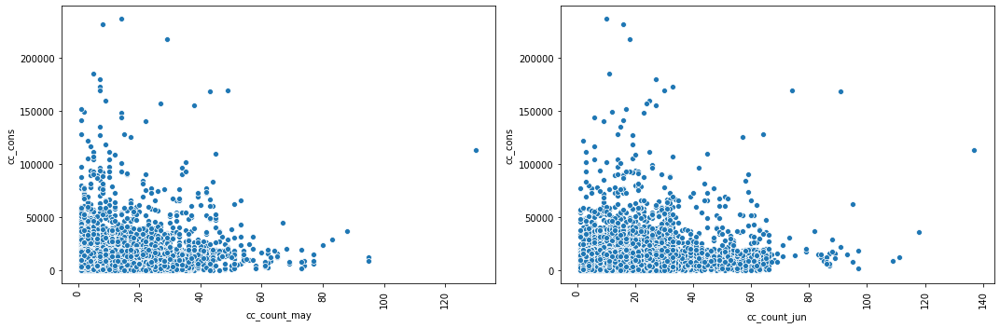

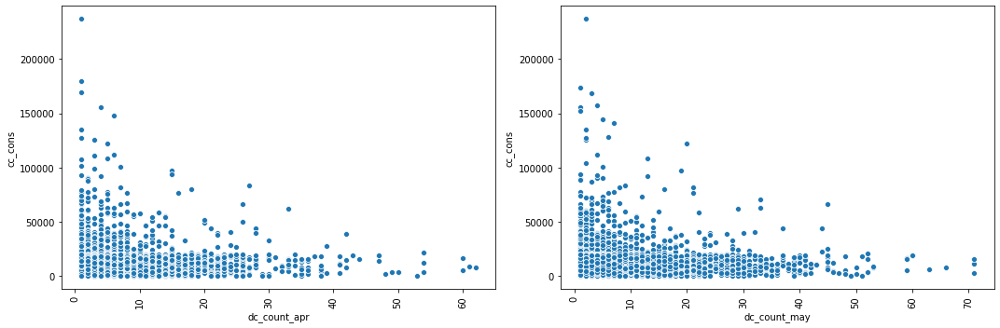

...

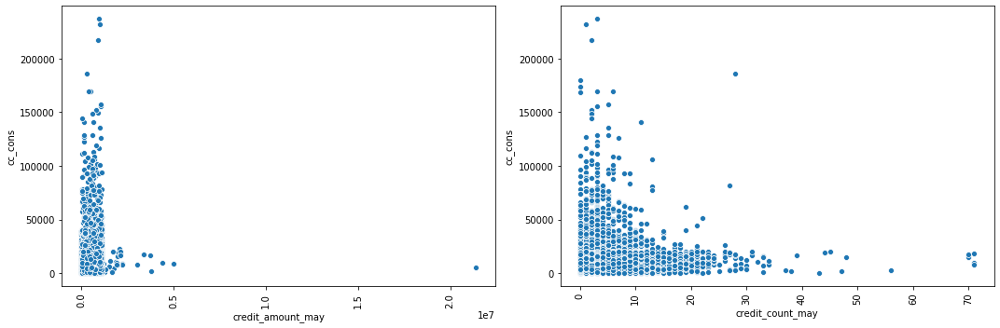

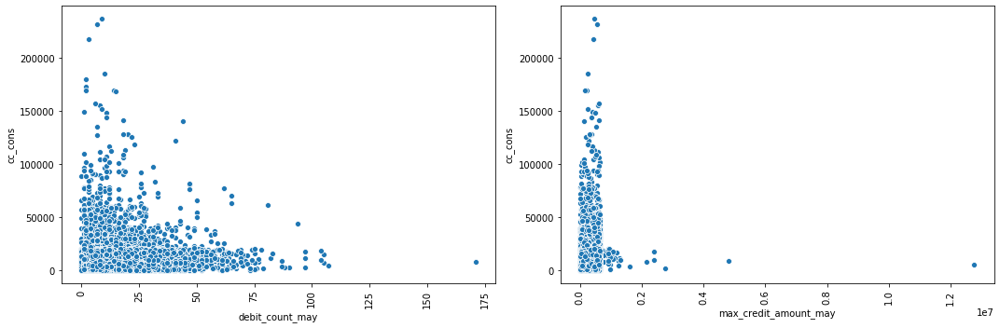

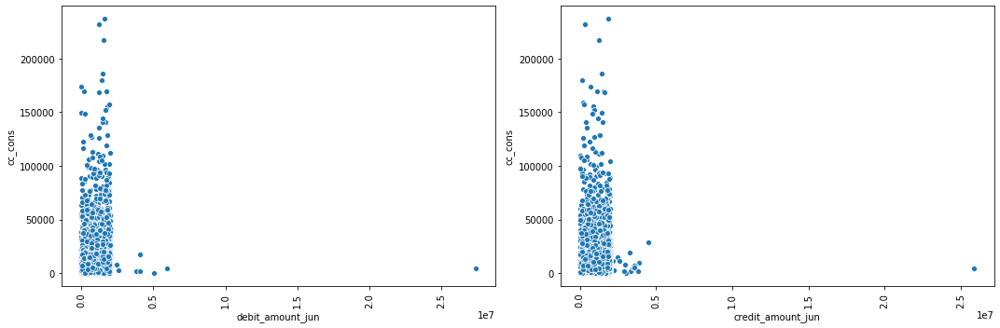

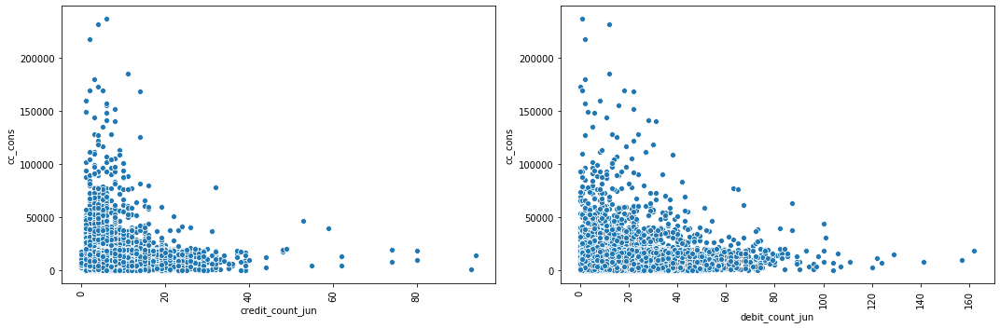

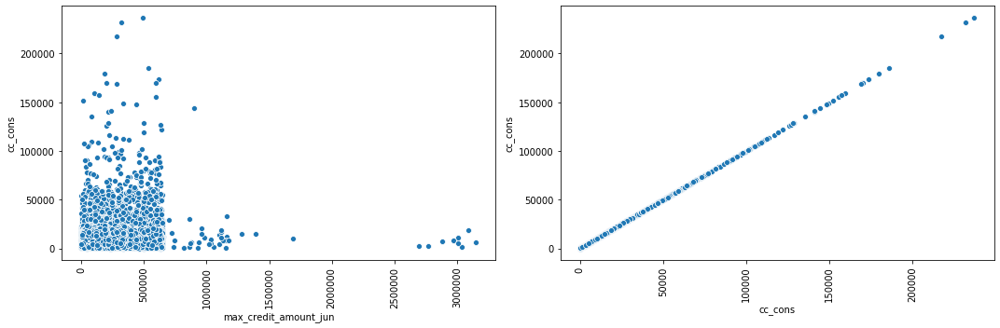

In [104]:
def bivariate_analysis_numerical(dataframe,target):
    num_cols = dataframe.select_dtypes(include=np.number).columns
    for i in range(0,len(num_cols),2):
        if len(num_cols) > i+1:
            plt.figure(figsize=(15,5))
            plt.subplot(121)
            sns.scatterplot(x=dataframe[num_cols[i]],y=target,data=dataframe)
            plt.xticks(rotation=90)
            plt.subplot(122)            
            sns.scatterplot(dataframe[num_cols[i+1]],y=target,data=dataframe)
            plt.xticks(rotation=90)
            plt.tight_layout()
            plt.show()


bivariate_analysis_numerical(df,df['cc_cons'])

In [105]:
impute_dataset = df 

In [106]:
impute_dataset.dc_cons_apr = impute_dataset.dc_cons_apr.fillna(impute_dataset.dc_cons_apr.median())
impute_dataset.dc_cons_may = impute_dataset.dc_cons_may.fillna(impute_dataset.dc_cons_may.median())
impute_dataset.dc_cons_jun = impute_dataset.dc_cons_jun.fillna(impute_dataset.dc_cons_jun.median())
impute_dataset.dc_count_apr = impute_dataset.dc_count_apr.fillna(impute_dataset.dc_count_apr.mode()[0])
impute_dataset.dc_count_may =  impute_dataset.dc_count_may.fillna(impute_dataset.dc_count_may.mode()[0])
impute_dataset.dc_count_jun =  impute_dataset.dc_count_jun.fillna(impute_dataset.dc_count_jun.mode()[0])
impute_dataset.cc_count_apr = impute_dataset.cc_count_apr.fillna(impute_dataset.cc_count_apr.mode()[0])
impute_dataset.cc_count_may =  impute_dataset.cc_count_may.fillna(impute_dataset.cc_count_may.mode()[0])
impute_dataset.cc_count_jun =  impute_dataset.cc_count_jun.fillna(impute_dataset.cc_count_jun.mode()[0])
impute_dataset.debit_count_apr =  impute_dataset.debit_count_apr.fillna(impute_dataset.debit_count_apr.mode()[0])
impute_dataset.debit_count_may =  impute_dataset.debit_count_may.fillna(impute_dataset.debit_count_may.mode()[0])
impute_dataset.debit_count_jun =  impute_dataset.debit_count_jun.fillna(impute_dataset.debit_count_jun.mode()[0])
impute_dataset.credit_count_apr =  impute_dataset.credit_count_apr.fillna(impute_dataset.credit_count_apr.mode()[0])
impute_dataset.credit_count_may =  impute_dataset.credit_count_may.fillna(impute_dataset.credit_count_may.mode()[0])
impute_dataset.credit_count_jun =  impute_dataset.credit_count_jun.fillna(impute_dataset.credit_count_jun.mode()[0])
impute_dataset.card_lim = impute_dataset.card_lim.fillna(impute_dataset.card_lim.median())
impute_dataset.credit_amount_apr = impute_dataset.credit_amount_apr.fillna(impute_dataset.credit_amount_apr.median())
impute_dataset.credit_amount_may = impute_dataset.credit_amount_may.fillna(impute_dataset.credit_amount_may.median())
impute_dataset.credit_amount_jun = impute_dataset.credit_amount_jun.fillna(impute_dataset.credit_amount_jun.median())
impute_dataset.debit_amount_apr = impute_dataset.debit_amount_apr.fillna(impute_dataset.debit_amount_apr.median())
impute_dataset.debit_amount_may = impute_dataset.debit_amount_may.fillna(impute_dataset.debit_amount_may.median())
impute_dataset.debit_amount_jun = impute_dataset.debit_amount_jun.fillna(impute_dataset.debit_amount_jun.median())
impute_dataset.max_credit_amount_apr = impute_dataset.max_credit_amount_apr.fillna(impute_dataset.max_credit_amount_apr.median())
impute_dataset.max_credit_amount_may = impute_dataset.max_credit_amount_may.fillna(impute_dataset.max_credit_amount_may.median())
impute_dataset.max_credit_amount_jun = impute_dataset.max_credit_amount_jun.fillna(impute_dataset.max_credit_amount_jun.median())


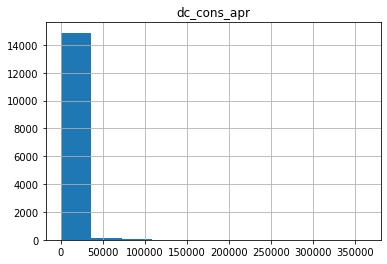

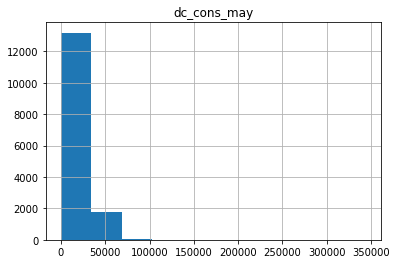

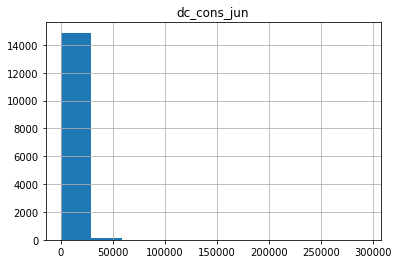

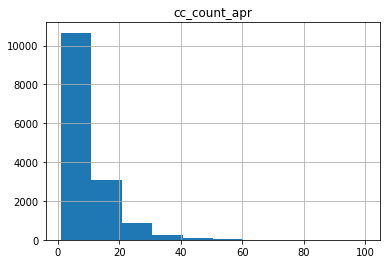

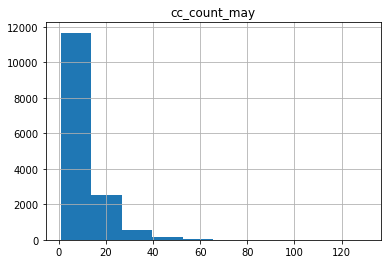

...

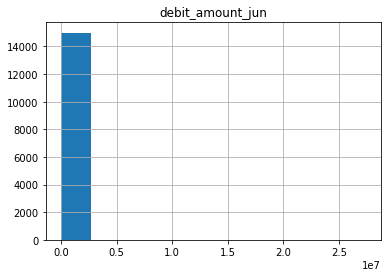

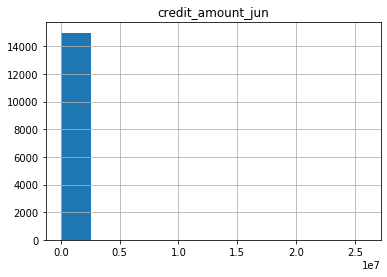

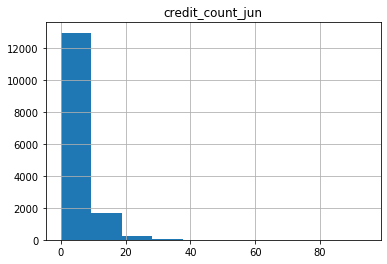

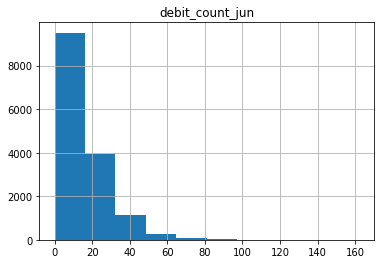

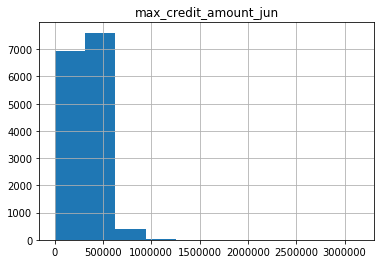

In [107]:
for i in Null_columns:
    plt.title(i)
    df[i].hist()
    plt.show()

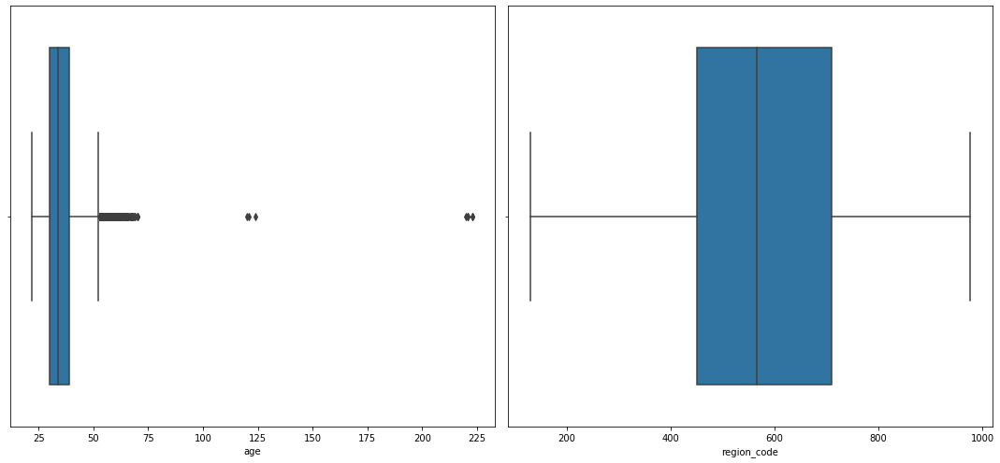

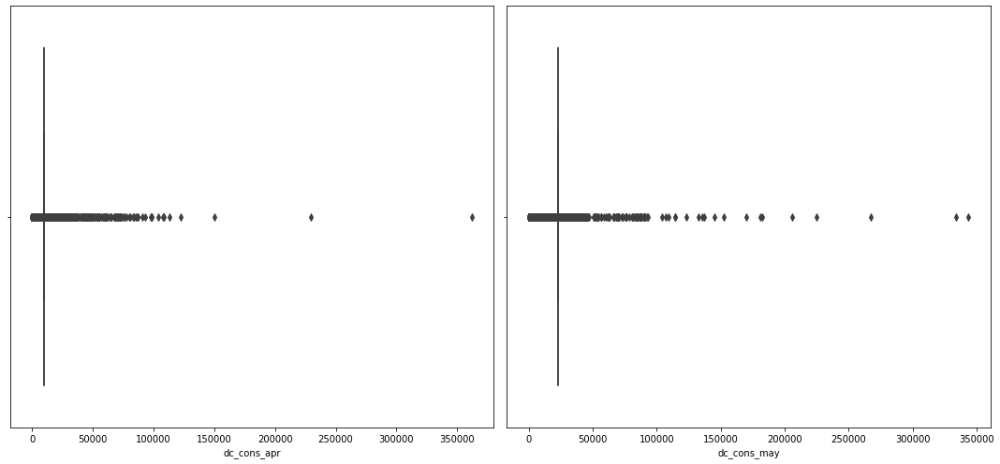

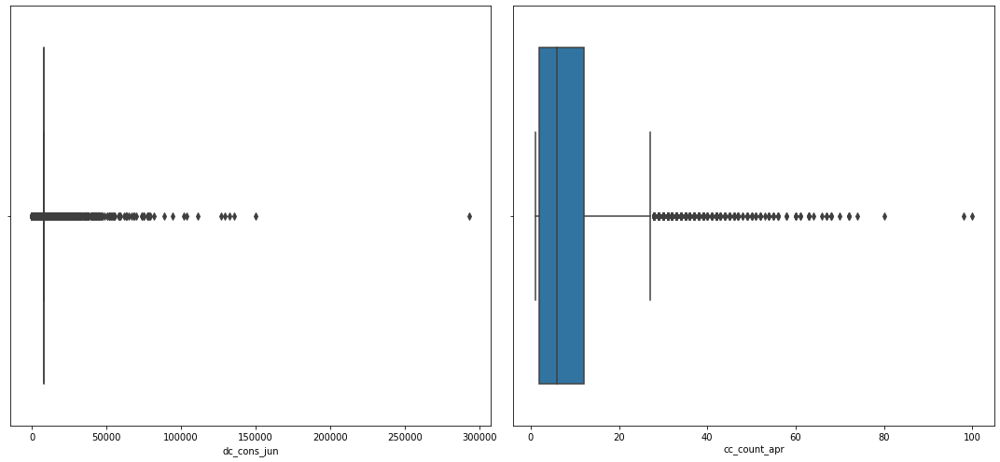

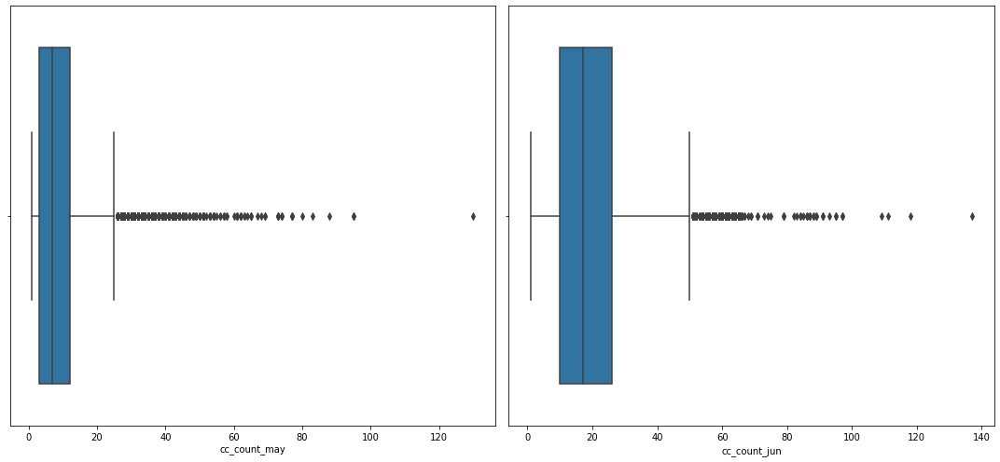

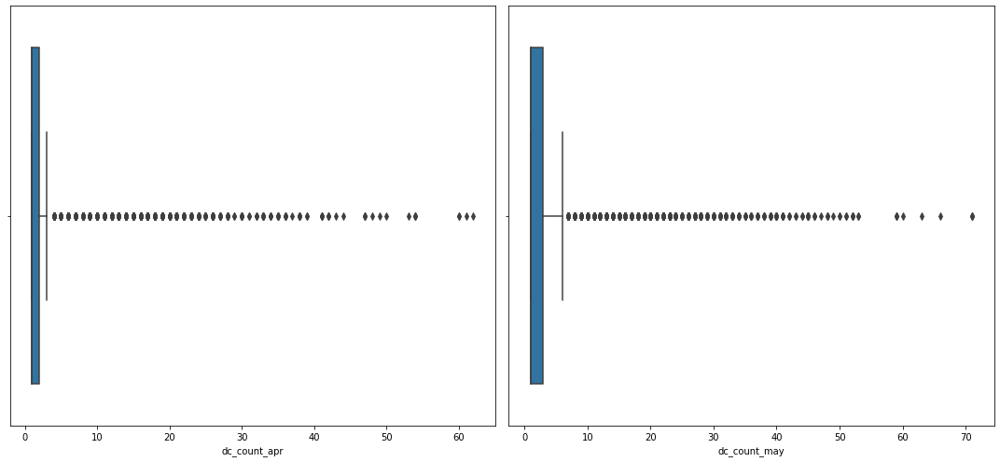

...

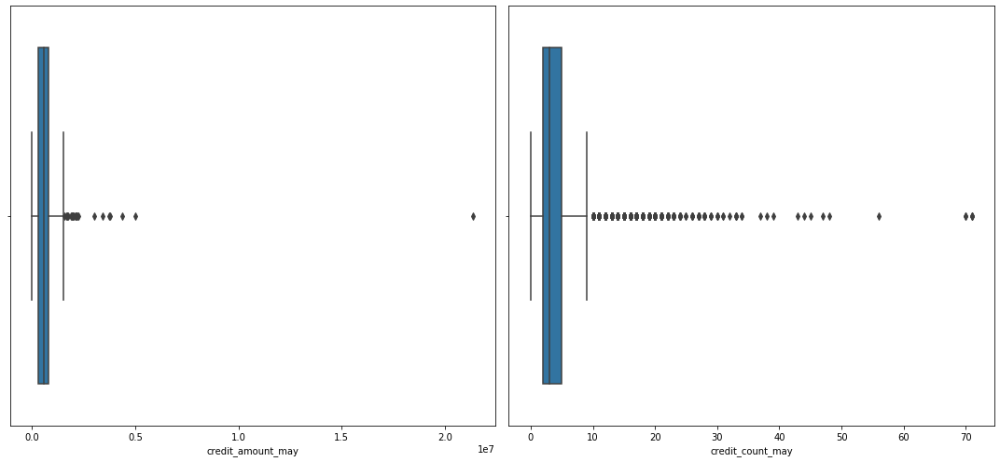

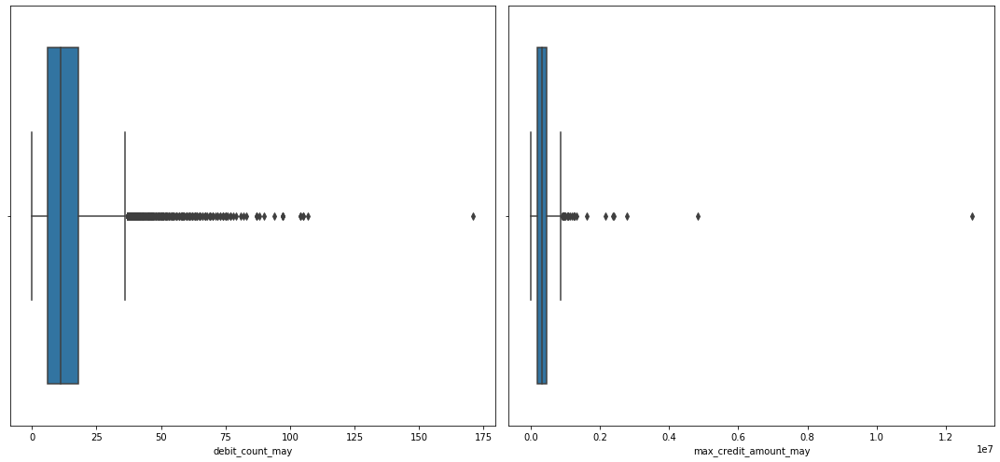

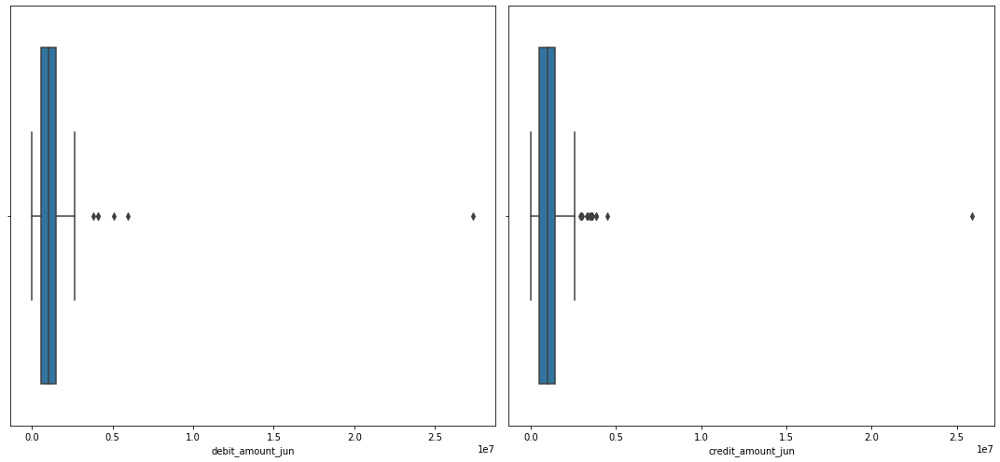

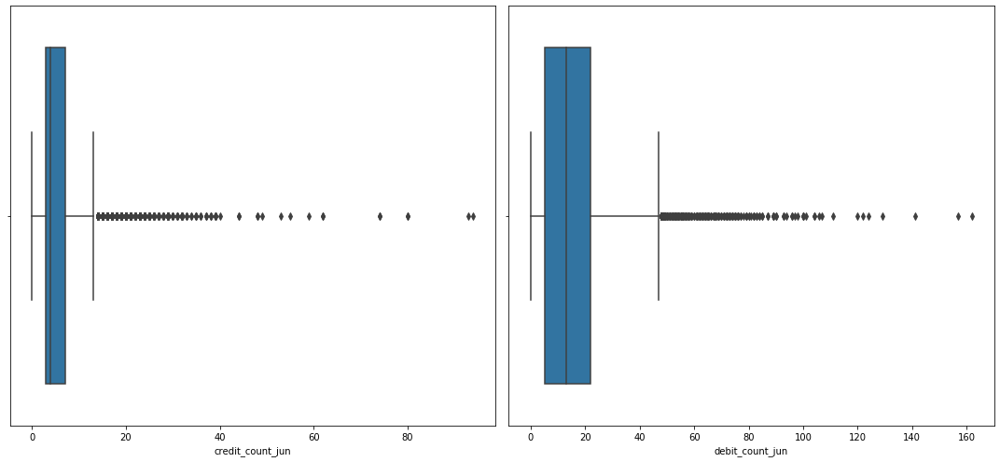

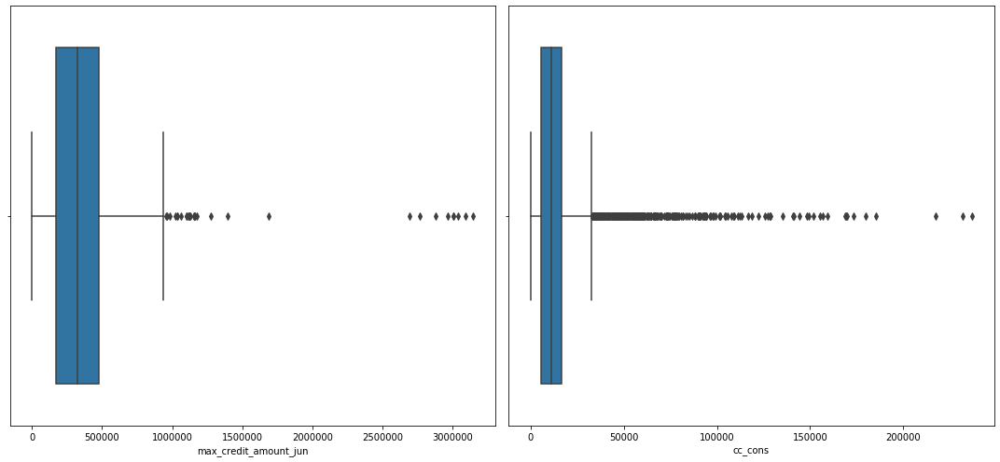

In [109]:
def plot_box_plots(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns.tolist()
    dataframe = dataframe[numeric_columns]
    
    for i in range(0,len(numeric_columns),2):
        if len(numeric_columns) > i+1:
            plt.figure(figsize=(15,7))
            plt.subplot(121)
            sns.boxplot(dataframe[numeric_columns[i]])
            plt.subplot(122)            
            sns.boxplot(dataframe[numeric_columns[i+1]])
            plt.tight_layout()
            plt.show()

        else:
            sns.boxplot(dataframe[numeric_columns[i]])
    
plot_box_plots(impute_dataset)

In [110]:
def detect_outliers(dataframe):
    cols = list(dataframe)
    outliers = pd.DataFrame(columns=['Feature','Number of Outliers'])
    
    for column in cols:
        if column in dataframe.select_dtypes(include=np.number).columns:
            # first quartile (Q1)
            q1 = dataframe[column].quantile(0.25) 
            
            # third quartile (Q3)
            q3 = dataframe[column].quantile(0.75)
            
            # IQR
            iqr = q3 - q1
            
            fence_low = q1 - (1.5*iqr)
            fence_high = q3 + (1.5*iqr)
            outliers = outliers.append({'Feature':column,'Number of Outliers':dataframe.loc[(dataframe[column] < fence_low) | (dataframe[column] > fence_high)].shape[0]},ignore_index=True)
    return outliers

detect_outliers(df)

,Feature,Number of Outliers
0,age,594
1,region_code,0
2,dc_cons_apr,6386
3,dc_cons_may,7152
4,dc_cons_jun,5334
5,cc_count_apr,549
6,cc_count_may,845
7,cc_count_jun,369
8,dc_count_apr,2931
9,dc_count_may,2296


In [111]:
impute_dataset.skew()

age                       4.729273
region_code              -0.355987
dc_cons_apr              13.985513
dc_cons_may               5.596448
dc_cons_jun              14.736036
cc_count_apr              2.233977
cc_count_may              2.332916
cc_count_jun              1.317751
dc_count_apr              4.499106
dc_count_may              3.954335
dc_count_jun              3.607471
card_lim                  2.248419
debit_amount_apr          9.785982
credit_amount_apr        15.212988
debit_count_apr           1.663957
credit_count_apr          3.692860
max_credit_amount_apr    16.446724
debit_amount_may         20.749097
credit_amount_may        13.091165
credit_count_may          4.208650
debit_count_may           2.068711
max_credit_amount_may    14.531877
debit_amount_jun          5.759281
credit_amount_jun         4.969080
credit_count_jun          4.180035
debit_count_jun           1.881496
max_credit_amount_jun     1.520896
cc_cons                   5.630844
dtype: float64

In [112]:
def treat_outliers(dataframe):
    cols = list(dataframe)
    for col in cols:
        if col in dataframe.select_dtypes(include=np.number).columns:
            dataframe[col] = winsorize(dataframe[col], limits=[0.00, 0.1],inclusive=(True, True))
    
    return dataframe    


dataframe = treat_outliers(impute_dataset)

# Checking for outliers after applying winsorization
detect_outliers(dataframe)

,Feature,Number of Outliers
0,age,0
1,region_code,0
2,dc_cons_apr,6386
3,dc_cons_may,7152
4,dc_cons_jun,5334
5,cc_count_apr,0
6,cc_count_may,0
7,cc_count_jun,0
8,dc_count_apr,2931
9,dc_count_may,2296


In [113]:
impute_dataset.skew()

age                      0.319127
region_code             -0.587318
dc_cons_apr             -0.672211
dc_cons_may             -0.502258
dc_cons_jun             -1.094201
cc_count_apr             0.673453
cc_count_may             0.655739
cc_count_jun            -0.028363
dc_count_apr             1.591225
dc_count_may             1.428479
dc_count_jun             1.362893
card_lim                 0.860039
debit_amount_apr        -0.084609
credit_amount_apr       -0.082445
debit_count_apr          0.398003
credit_count_apr         0.511006
max_credit_amount_apr   -0.075800
debit_amount_may        -0.105384
credit_amount_may       -0.100347
credit_count_may         0.624510
debit_count_may          0.549334
max_credit_amount_may   -0.100209
debit_amount_jun        -0.102041
credit_amount_jun       -0.071683
credit_count_jun         0.648638
debit_count_jun          0.492490
max_credit_amount_jun   -0.083796
cc_cons                 -0.064301
dtype: float64

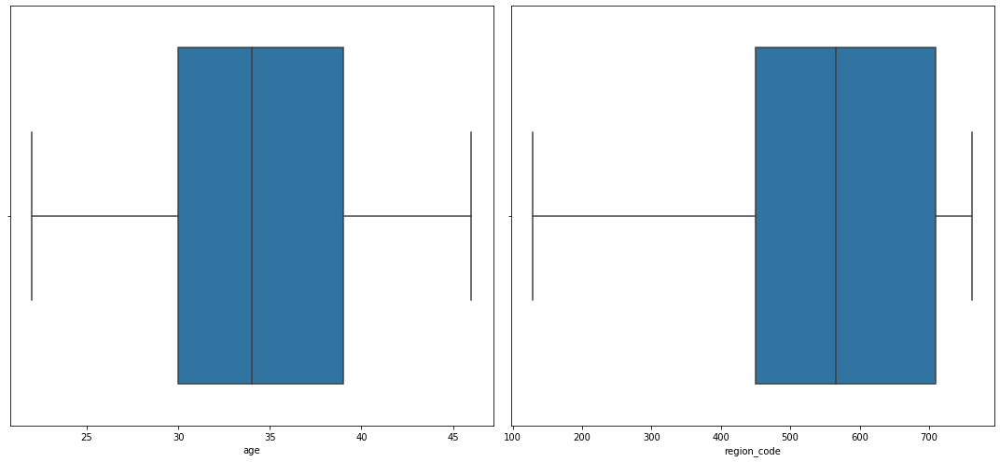

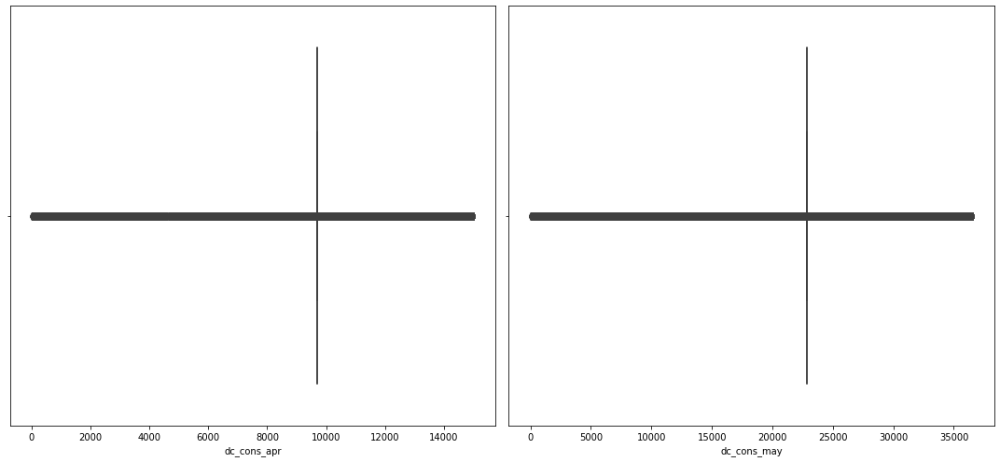

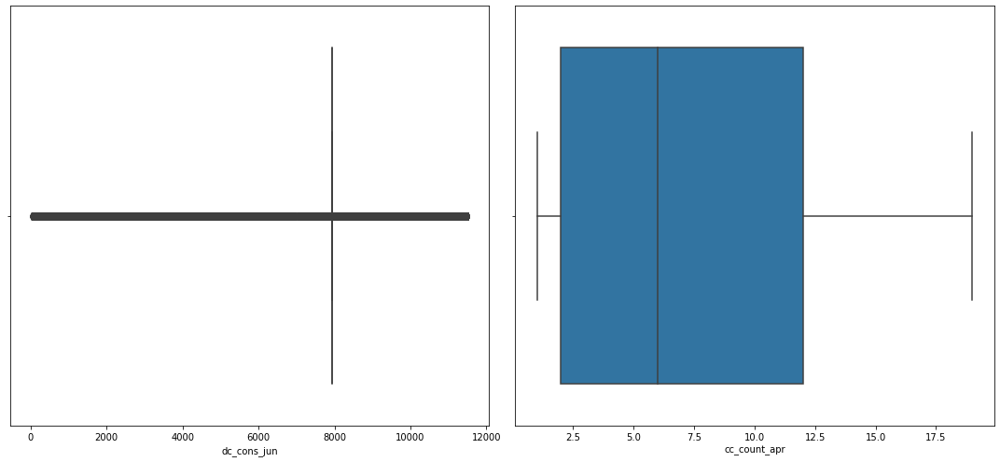

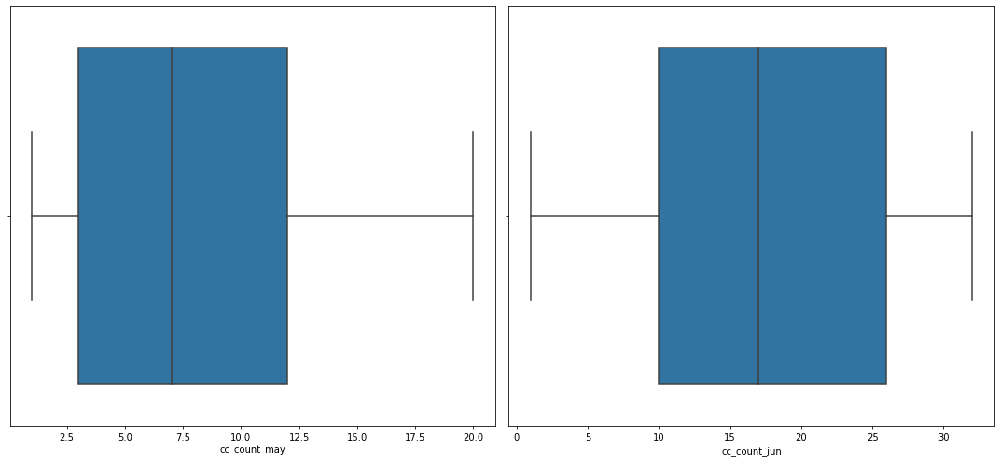

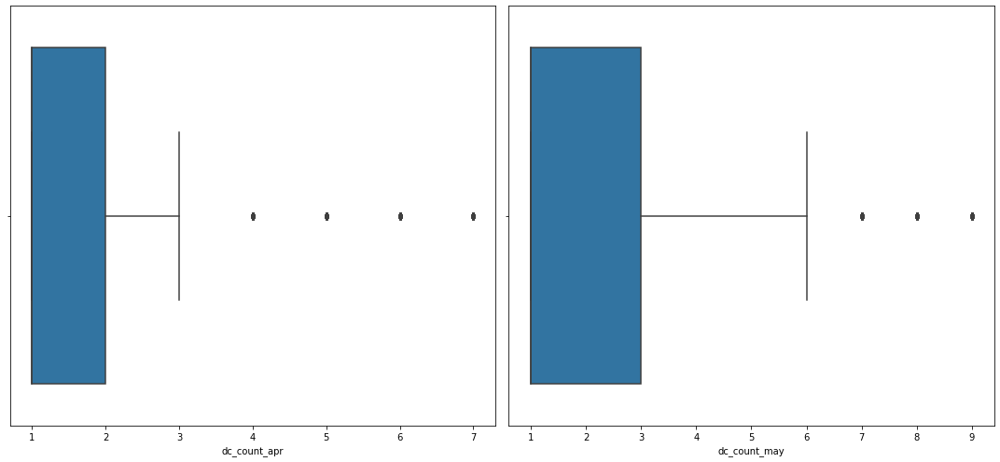

...

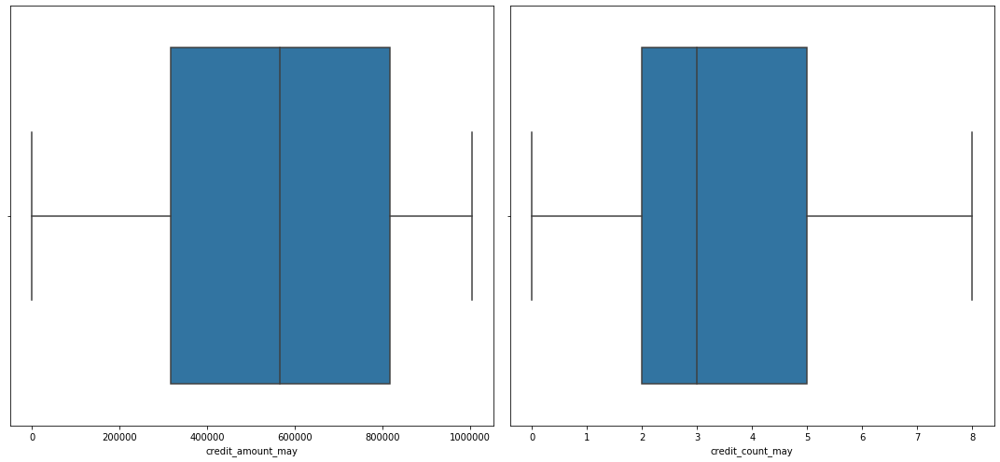

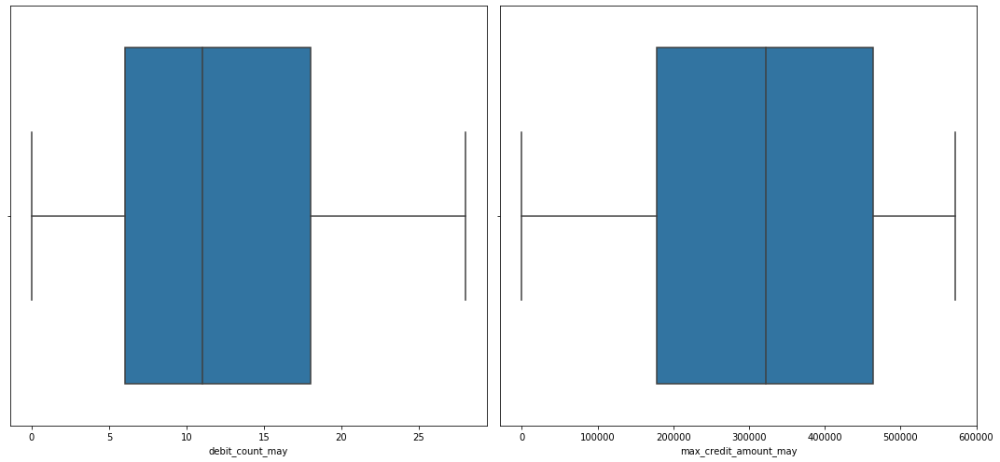

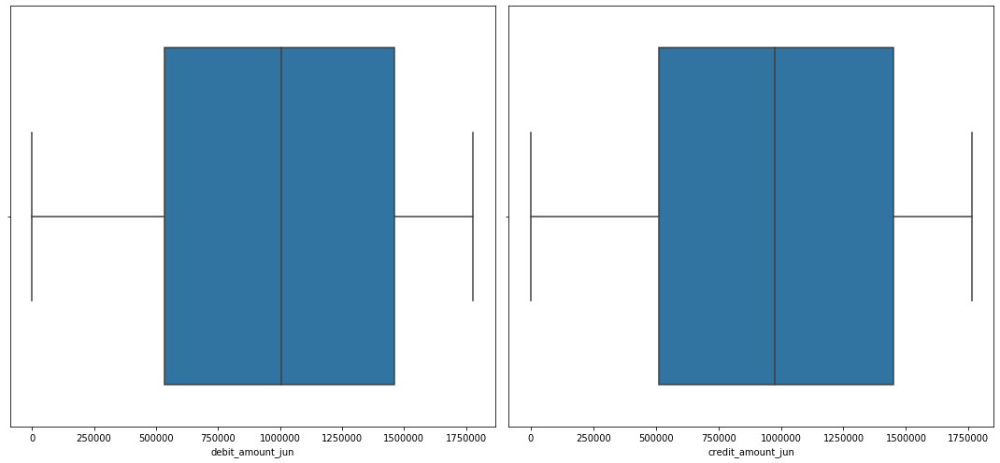

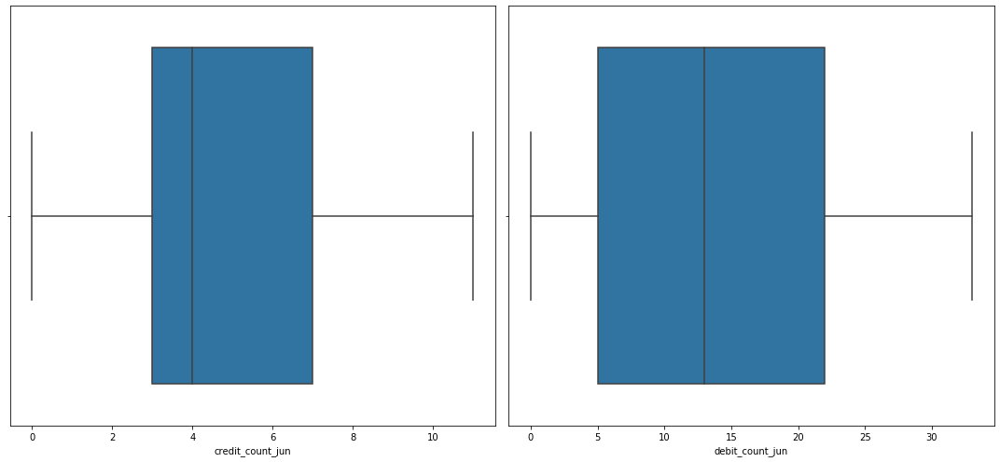

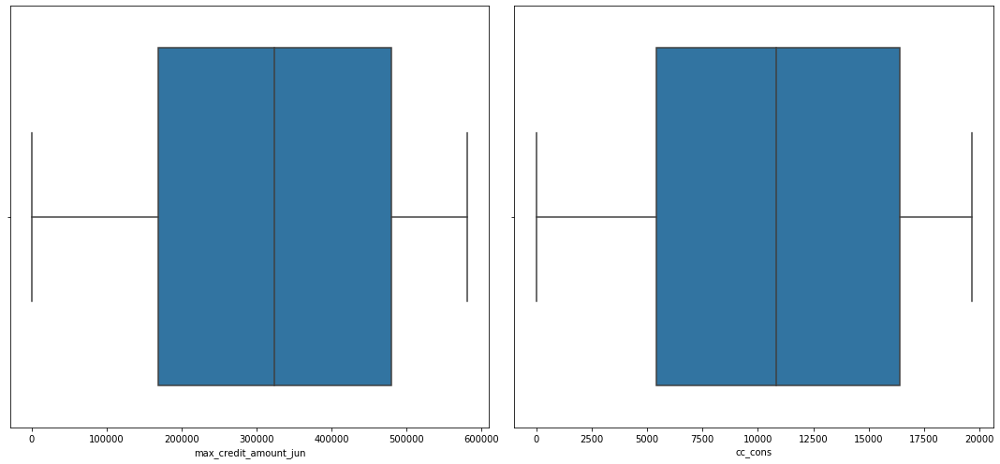

In [114]:
plot_box_plots(impute_dataset)

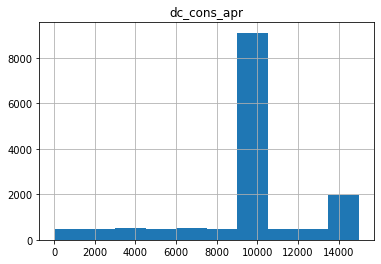

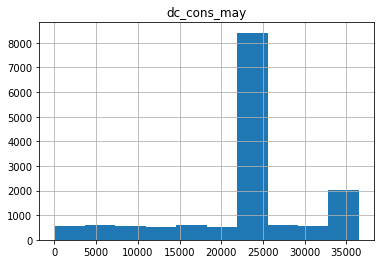

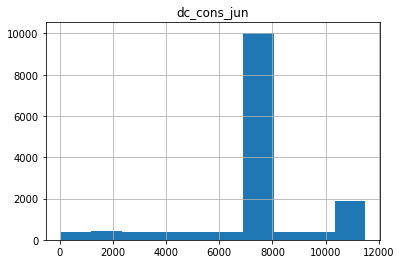

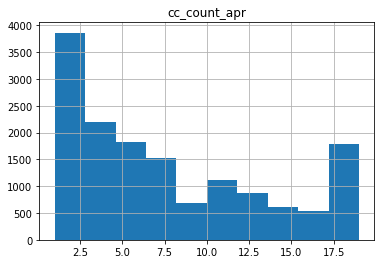

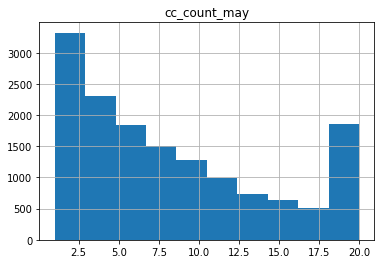

...

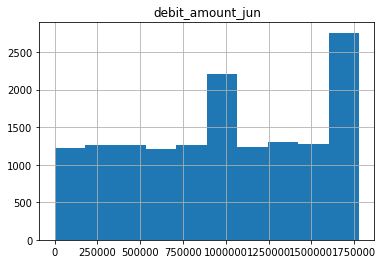

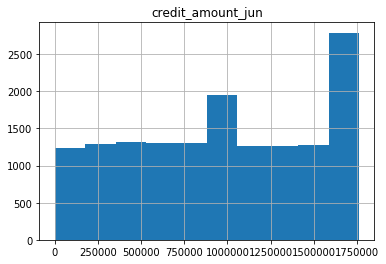

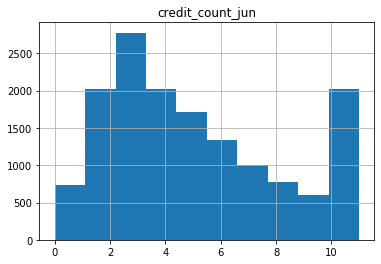

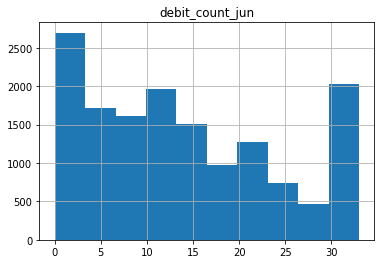

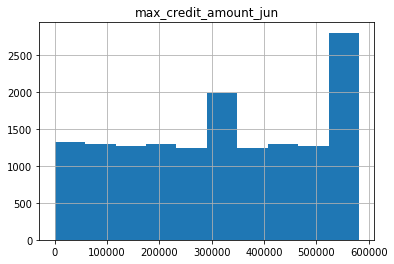

In [72]:
for i in Null_columns:
    plt.title(i)
    df[i].hist()
    plt.show()

In [115]:
df.skew()

age                      0.319127
region_code             -0.587318
dc_cons_apr             -0.672211
dc_cons_may             -0.502258
dc_cons_jun             -1.094201
cc_count_apr             0.673453
cc_count_may             0.655739
cc_count_jun            -0.028363
dc_count_apr             1.591225
dc_count_may             1.428479
dc_count_jun             1.362893
card_lim                 0.860039
debit_amount_apr        -0.084609
credit_amount_apr       -0.082445
debit_count_apr          0.398003
credit_count_apr         0.511006
max_credit_amount_apr   -0.075800
debit_amount_may        -0.105384
credit_amount_may       -0.100347
credit_count_may         0.624510
debit_count_may          0.549334
max_credit_amount_may   -0.100209
debit_amount_jun        -0.102041
credit_amount_jun       -0.071683
credit_count_jun         0.648638
debit_count_jun          0.492490
max_credit_amount_jun   -0.083796
cc_cons                 -0.064301
dtype: float64

In [116]:
for col in df.select_dtypes(exclude ='object').columns:
    if df[col].skew() > 1:
        print(col, df[col].skew())

dc_count_apr 1.5912248843226493
dc_count_may 1.4284792087816345
dc_count_jun 1.362892578955004


In [117]:
for col in df.select_dtypes(exclude ='object').columns:
    if df[col].skew() > 1:
        df[col] = np.log(df[col])
        print(col, df[col].skew())

dc_count_apr 1.226685265407373
dc_count_may 1.001008710666417
dc_count_jun 0.803120921196702


In [120]:
for col in df.select_dtypes(exclude ='object').columns:
    if df[col].skew() < -1:
        print(col, df[col].skew())

In [121]:
for col in df.select_dtypes(exclude ='object').columns:
    if df[col].skew() < -1:
        df[col] = np.square(df[col])
        print(col, df[col].skew())

In [122]:
df.skew()

age                      0.319127
region_code             -0.587318
dc_cons_apr             -0.672211
dc_cons_may             -0.502258
dc_cons_jun              0.423198
cc_count_apr             0.673453
cc_count_may             0.655739
cc_count_jun            -0.028363
dc_count_apr             1.226685
dc_count_may             1.001009
dc_count_jun             0.803121
card_lim                 0.860039
debit_amount_apr        -0.084609
credit_amount_apr       -0.082445
debit_count_apr          0.398003
credit_count_apr         0.511006
max_credit_amount_apr   -0.075800
debit_amount_may        -0.105384
credit_amount_may       -0.100347
credit_count_may         0.624510
debit_count_may          0.549334
max_credit_amount_may   -0.100209
debit_amount_jun        -0.102041
credit_amount_jun       -0.071683
credit_count_jun         0.648638
debit_count_jun          0.492490
max_credit_amount_jun   -0.083796
cc_cons                 -0.064301
dtype: float64

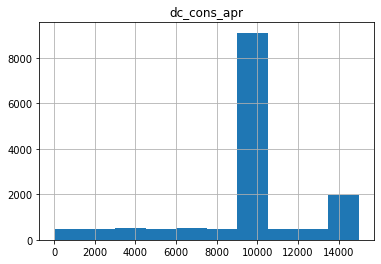

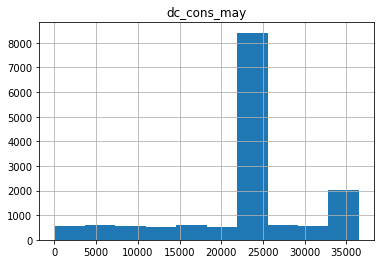

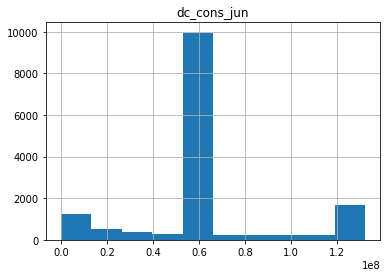

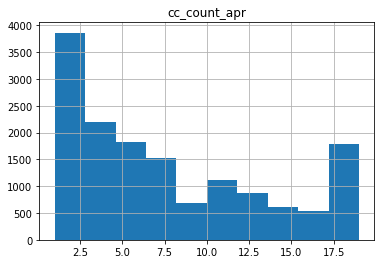

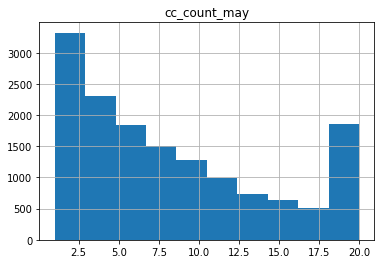

...

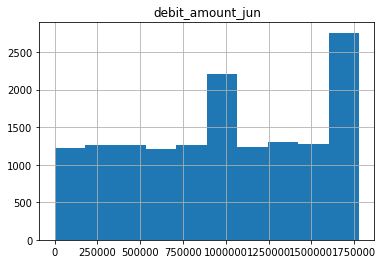

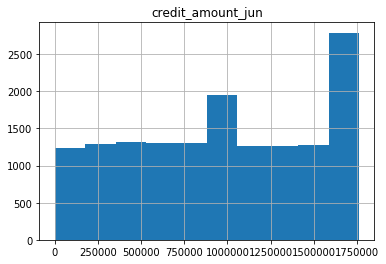

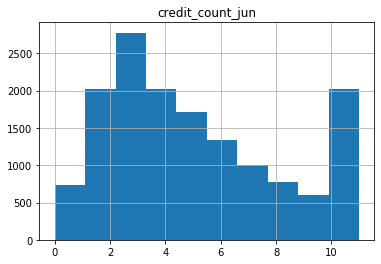

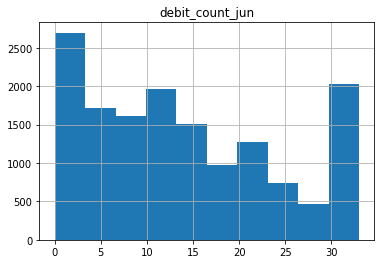

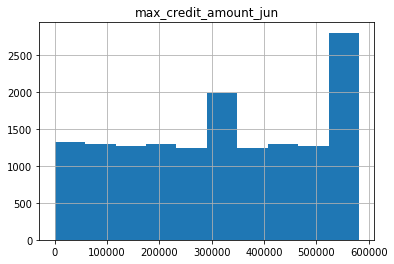

In [123]:
for i in Null_columns:
    plt.title(i)
    df[i].hist()
    plt.show()

In [84]:
num_cols = df.select_dtypes(exclude ='object').columns.tolist()
num_cols

['age',
 'region_code',
 'dc_cons_apr',
 'dc_cons_may',
 'dc_cons_jun',
 'cc_count_apr',
 'cc_count_may',
 'cc_count_jun',
 'dc_count_apr',
 'dc_count_may',
 'dc_count_jun',
 'card_lim',
 'debit_amount_apr',
 'credit_amount_apr',
 'debit_count_apr',
 'credit_count_apr',
 'max_credit_amount_apr',
 'debit_amount_may',
 'credit_amount_may',
 'credit_count_may',
 'debit_count_may',
 'max_credit_amount_may',
 'debit_amount_jun',
 'credit_amount_jun',
 'credit_count_jun',
 'debit_count_jun',
 'max_credit_amount_jun',
 'cc_cons']

In [124]:
scaler =MinMaxScaler()
scaler.fit(df[num_cols])

df[num_cols] = scaler.transform(df[num_cols])


In [125]:
df.head()

,account_type,gender,age,region_code,dc_cons_apr,dc_cons_may,dc_cons_jun,cc_count_apr,cc_count_may,cc_count_jun,dc_count_apr,dc_count_may,dc_count_jun,card_lim,debit_amount_apr,credit_amount_apr,debit_count_apr,credit_count_apr,max_credit_amount_apr,debit_amount_may,credit_amount_may,credit_count_may,debit_count_may,max_credit_amount_may,debit_amount_jun,credit_amount_jun,credit_count_jun,debit_count_jun,max_credit_amount_jun,cc_cons
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12554,saving,F,0.583333,0.327014,0.715760,0.719566,1.000000,0.166667,0.263158,0.354839,0.000000,0.000000,0.428317,0.880383,0.118203,1.000000,0.000000,0.285714,0.870286,0.435866,0.730158,0.25,0.035714,0.192811,0.626599,0.389652,0.181818,0.030303,0.278327,0.099028
17645,current,M,0.083333,0.631912,1.000000,0.447496,1.000000,0.722222,0.473684,0.967742,1.000000,0.732487,0.934870,0.085163,0.655123,0.309800,0.666667,0.571429,0.785001,0.629077,0.140290,0.25,0.607143,0.588037,0.225395,0.134341,0.909091,0.939394,0.911723,1.000000
7604,current,M,0.500000,0.650869,0.646605,0.454905,0.504783,1.000000,0.368421,0.709677,0.000000,1.000000,0.810714,0.198511,0.682307,0.740169,0.933333,0.428571,0.223231,0.616024,0.369191,0.50,0.785714,0.627074,0.502719,1.000000,0.454545,0.727273,0.828227,0.736298
1590,current,M,0.708333,0.622433,1.000000,0.488671,1.000000,0.000000,0.000000,0.516129,0.564575,0.732487,1.000000,1.000000,0.054189,0.917081,1.000000,0.714286,0.804869,0.279810,0.258957,0.75,1.000000,0.380286,0.996424,0.724082,0.636364,1.000000,0.923216,0.330467
16556,current,M,0.250000,0.173776,0.646605,0.976980,1.000000,1.000000,0.684211,1.000000,0.000000,0.732487,1.000000,0.122558,0.260450,0.520015,0.166667,0.714286,0.517026,0.205968,0.393862,0.50,0.535714,0.906619,0.479180,0.346642,0.272727,0.787879,0.600852,0.742354


In [126]:
le = LabelEncoder()
# Function that auto encodes any dataframe column of type category or object.
def dummyEncode(dataset):
        
        columnsToEncode = list(dataset.select_dtypes(include=['category','object']))
        le = LabelEncoder()
        for feature in columnsToEncode:
            try:
                dataset[feature] = le.fit_transform(dataset[feature])
            except:
                print('Error encoding '+feature)
        return dataset
dataframe = dummyEncode(df)

In [127]:
df.head()

,account_type,gender,age,region_code,dc_cons_apr,dc_cons_may,dc_cons_jun,cc_count_apr,cc_count_may,cc_count_jun,dc_count_apr,dc_count_may,dc_count_jun,card_lim,debit_amount_apr,credit_amount_apr,debit_count_apr,credit_count_apr,max_credit_amount_apr,debit_amount_may,credit_amount_may,credit_count_may,debit_count_may,max_credit_amount_may,debit_amount_jun,credit_amount_jun,credit_count_jun,debit_count_jun,max_credit_amount_jun,cc_cons
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12554,1,0,0.583333,0.327014,0.715760,0.719566,1.000000,0.166667,0.263158,0.354839,0.000000,0.000000,0.428317,0.880383,0.118203,1.000000,0.000000,0.285714,0.870286,0.435866,0.730158,0.25,0.035714,0.192811,0.626599,0.389652,0.181818,0.030303,0.278327,0.099028
17645,0,1,0.083333,0.631912,1.000000,0.447496,1.000000,0.722222,0.473684,0.967742,1.000000,0.732487,0.934870,0.085163,0.655123,0.309800,0.666667,0.571429,0.785001,0.629077,0.140290,0.25,0.607143,0.588037,0.225395,0.134341,0.909091,0.939394,0.911723,1.000000
7604,0,1,0.500000,0.650869,0.646605,0.454905,0.504783,1.000000,0.368421,0.709677,0.000000,1.000000,0.810714,0.198511,0.682307,0.740169,0.933333,0.428571,0.223231,0.616024,0.369191,0.50,0.785714,0.627074,0.502719,1.000000,0.454545,0.727273,0.828227,0.736298
1590,0,1,0.708333,0.622433,1.000000,0.488671,1.000000,0.000000,0.000000,0.516129,0.564575,0.732487,1.000000,1.000000,0.054189,0.917081,1.000000,0.714286,0.804869,0.279810,0.258957,0.75,1.000000,0.380286,0.996424,0.724082,0.636364,1.000000,0.923216,0.330467
16556,0,1,0.250000,0.173776,0.646605,0.976980,1.000000,1.000000,0.684211,1.000000,0.000000,0.732487,1.000000,0.122558,0.260450,0.520015,0.166667,0.714286,0.517026,0.205968,0.393862,0.50,0.535714,0.906619,0.479180,0.346642,0.272727,0.787879,0.600852,0.742354


In [130]:
df.shape

(15000, 30)

In [131]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [135]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, random_state=42)

In [136]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
lr = LinearRegression()
lr.fit(X_train,y_train)
y_pred = lr.predict(X_val)

In [137]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
print("Mean Squared Error: ",mean_squared_error(y_pred, y_val))
print("R2 Score: ",r2_score(y_pred, y_val))
print("Mean Absolute Error: ",mean_absolute_error(y_pred, y_val))
print("RMSE: ",np.sqrt(mean_squared_error(y_pred, y_val)))

Mean Squared Error:  0.0977827658155926
R2 Score:  -235.87557182370935
Mean Absolute Error:  0.2710471255038971
RMSE:  0.31270235978577554


In [146]:
df_new = pd.read_csv('Train.csv')


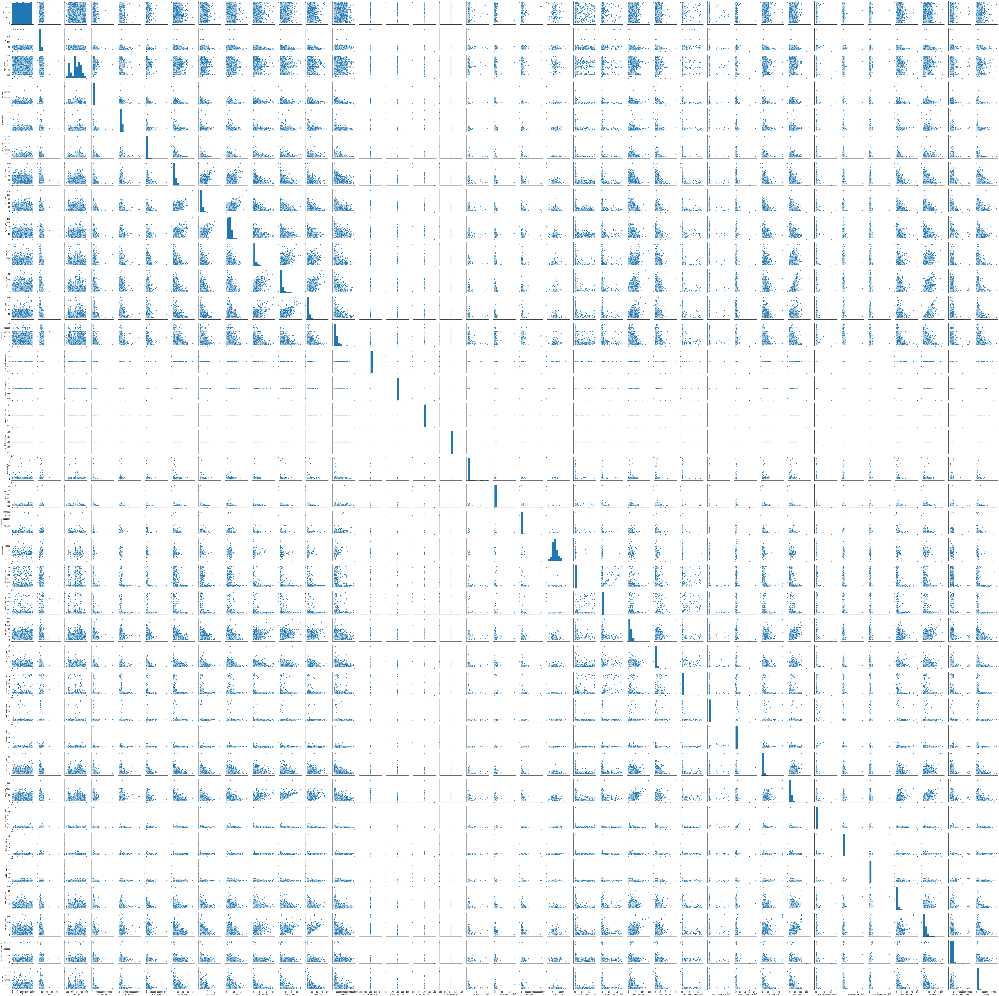

In [140]:
sns.pairplot(df_new)

In [141]:
import statsmodels.api as sm
from scipy import stats

In [148]:
df_new.isnull().sum()
null

,Total,Percent
cc_cons,0,0.0
max_credit_amount_jun,0,0.0
gender,0,0.0
age,0,0.0
region_code,0,0.0
dc_cons_apr,0,0.0
dc_cons_may,0,0.0
dc_cons_jun,0,0.0
cc_count_apr,0,0.0
cc_count_may,0,0.0


In [ ]:
X = df_new.iloc[:,:-1]
y = df_new.iloc[:,-1]
